In [16]:
# Standard stuff
import numpy as np
from matplotlib import pyplot as plt

# Utils
from utils.data_utils import load_data
from utils.plot_utils import newplot, hist_with_outline, hist_with_errors, function_with_band
from utils.stats_utils import correlation_improved_estimates


import os, sys
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# # ML stuff
from keras.layers import Dense, Dropout, Input, Concatenate, LeakyReLU
import tensorflow as tf
# from GaussianAnsatz.utils import build_gaussianAnsatz_DNN, build_gaussianAnsatz_EFN, build_gaussianAnsatz_PFN, determine_constant
import energyflow as ef

In [17]:
y_dim = 1
x_dim = 3
loadfile = None
dnn_loadfile = "Models/DNN.hdf5"
efn_loadfile = "Models/EFN.hdf5"
pfn_loadfile = "Models/PFN.hdf5"
pfn_pid_loadfile = "Models/PFN_PID.hdf5"

cache_dir = "~/.energyflow"

# Switch for using gen vs. sim for determining leading vs. subleading
use_sim_for_lead = True


# Models
model_keys = ["DNN", "EFN", "PFN", "PFN-PID", "CMS"]
models = {}

colors = ['red', 'yellow', 'green', 'blue', "purple"]
labels = ['DNN', "EFN", "PFN", "PFN-PID", "CMS"]

# Dataset Parameters
momentum_scale = 1000
n = 2500
pad = 150
pad_EFN = 150
pad_PFN = 150
pt_lower, pt_upper = 600, 1000
eta = 2.4
quality = 2
epochs = 150
d_multiplier = 0.0

# Load Data

In [18]:
# Load Data

# No cuts applied for now
X, Z, C, particle_counts, W, event_ids, pairs = load_data(cache_dir = cache_dir,
                                                                pt_lower=0,
                                                                pt_upper=10000,
                                                                eta=eta,
                                                                quality=quality,
                                                                n= 265276*12, #265276*2,
                                                                momentum_scale=momentum_scale,
                                                                pad=pad,
                                                                return_pfcs=False,
                                                                amount=2
                                                                )


print(2 * pairs.shape[0] / X.shape[0])
gen_px = Z[:, 0] * np.cos(Z[:, 2])
gen_py = Z[:, 0] * np.sin(Z[:, 2])

/home/rikab/miniconda3/envs/SHAPER/lib/python3.8/site-packages/energyflow/datasets/mod.py:272: UserWarning: Requested 2 files but only have 1
  warnings.warn('Requested {} files but only have {}'.format(amount, nfiles))


X:  (1412955, 3) float32
Y:  (1412955, 3) float32
PFCs:  (1412955, 150, 3) float32
0.9942991815025957


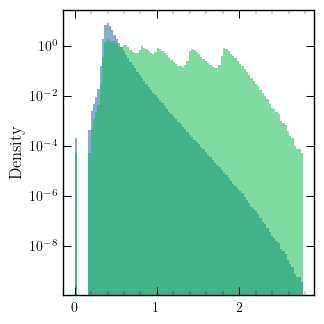

In [19]:
# Test weights
newplot("column")
plt.hist(Z[:,0], bins=100, weights=W, density=True, alpha=0.5, label="Gen"),
plt.hist(Z[:,0], bins=100, density=True, alpha=0.5) 

plt.ylabel("Density")
plt.yscale("log")

In [20]:
# specs = [f'{500} <= gen_jet_pts <= {1000}', f' abs_gen_jet_eta < {eta}', f' quality >= {quality}']
# sim = ef.mod.load(*specs, cache_dir =  cache_dir, dataset='sim')

# simjets_f = sim.jets_f
# simjets_i = sim.jets_i

# # count number of instances where simjets_i[j,3] == simjets_i[j+1, 3]
# count = 0
# for j in range(len(simjets_i)-1):
#     if simjets_i[j,3] == simjets_i[j+1, 3]:
#         count += 1  
# print(count, 2 * count / len(simjets_i))
# print(len(simjets_i))


# print(simjets_i[:,3])

# Missing pT Fits

In [21]:
# Collect Pairs

leading_jet_index = np.zeros(pairs.shape[0], dtype=int)
subleading_jet_index = np.zeros(pairs.shape[0], dtype=int)

print(X.shape)
print(Z.shape)


for (i, pair) in enumerate(pairs):

        if use_sim_for_lead:
                pt1 = X[pair[0], 0]
                pt2 = X[pair[1], 0]
        else:
                pt1 = Z[pair[0], 0]
                pt2 = Z[pair[1], 0]

        if pt1 > pt2:
                leading_jet_index[i] = pair[0]
                subleading_jet_index[i] = pair[1]
        else:
                leading_jet_index[i] = pair[1]
                subleading_jet_index[i] = pair[0]

leading_weights = W[leading_jet_index]
subleading_weights = W[subleading_jet_index]    

leading_gen_pt = Z[leading_jet_index, 0]
subleading_gen_pt = Z[subleading_jet_index, 0]

leading_sim_pt = X[leading_jet_index, 0]
subleading_sim_pt = X[subleading_jet_index, 0]

leading_sim_eta = X[leading_jet_index, 1]
subleading_sim_eta = X[subleading_jet_index, 1]

# Get indices of pairs where leading passes cuts
leading_passes_pt_cuts = np.logical_and(leading_sim_pt > pt_lower / momentum_scale, leading_sim_pt < pt_upper / momentum_scale)
leading_passes_eta_cuts = np.abs(leading_sim_eta) < eta
leading_passes_cuts = np.where(np.logical_and(leading_passes_pt_cuts, leading_passes_eta_cuts) > 0)[0]


leading_jet_index = leading_jet_index[leading_passes_cuts]
subleading_jet_index = subleading_jet_index[leading_passes_cuts]


leading_weights = W[leading_jet_index]
subleading_weights = W[subleading_jet_index]    

leading_gen_pt = Z[leading_jet_index, 0]
subleading_gen_pt = Z[subleading_jet_index, 0]

leading_sim_pt = X[leading_jet_index, 0]
subleading_sim_pt = X[subleading_jet_index, 0]

leading_sim_eta = X[leading_jet_index, 1]
subleading_sim_eta = X[subleading_jet_index, 1]

print(leading_weights.shape)


(1412955, 3)
(1412955, 3)
(217102,)


/tmp/ipykernel_76117/1658771202.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig("Plots/leading_subleading.pdf", bbox_inches='tight')
/tmp/ipykernel_76117/1658771202.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig("Plots/leading_subleading_SIM.pdf", bbox_inches='tight')
/home/rikab/miniconda3/envs/SHAPER/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


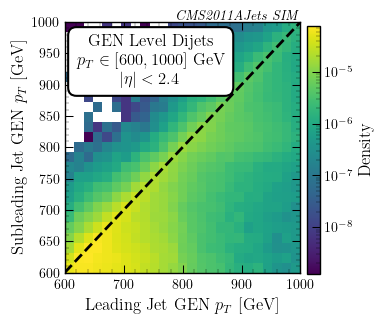

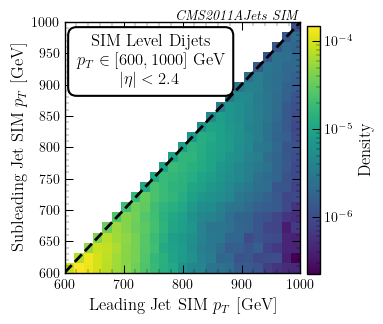

In [22]:
import matplotlib as mpl

# 2d histogram of the leading gen_pt vs the subleading gen_pt for each pair

fig, ax = newplot("column",  stamp="\it{CMS2011AJets SIM}")
im = plt.hist2d(leading_gen_pt * momentum_scale, subleading_gen_pt * momentum_scale, weights = leading_weights, bins=25, range=[[pt_lower, 1000], [pt_lower, 1000]], norm=mpl.colors.LogNorm(), density = True)

# Line at y = x
plt.plot([pt_lower, pt_upper], [pt_lower, pt_upper], color='black', linestyle='--', linewidth=2)

# Ensure main body of plot is square



plt.xlabel("Leading Jet GEN $p_T$ [GeV]")
plt.ylabel("Subleading Jet GEN $p_T$ [GeV]")


# plt.colorbar(   )

# Text in the upper left
plt.gcf().text(0.05, 0.95, f'GEN Level Dijets\n$p_T \in [{pt_lower}, 1000]$ GeV\n$|\eta| < {eta}$', transform=plt.gca().transAxes,
        ha = 'left',multialignment='center', verticalalignment='top', backgroundcolor='white',bbox=dict(facecolor='w', linewidth=1.5,edgecolor='black', boxstyle='round,pad=0.5'))
# t.set_bbox(dict(facecolor='white', alpha=1.0, edgecolor='black'))

cb_ax = fig.add_axes([.925,.17,.04,.73])
cbar = plt.colorbar(orientation='vertical',cax=cb_ax)
cbar.set_label('Density')


# plt.gcf().text(0.725, 0.83,r'\begin{center} {\bf Fiducial model} \linebreak {$\rho_\phi = \frac{1}{\lambda_\phi \lambda_q}\sqrt{8 \pi \epsilon} (m_{q_1}m_{q_2})^2$} \end{center}',
#                ha='center',color='black',multialignment='center',bbox=dict(facecolor='w', linewidth=1.5,edgecolor='black', boxstyle='round,pad=0.2'),fontsize=25);


plt.savefig("Plots/leading_subleading.pdf", bbox_inches='tight')

fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}")
plt.hist2d(leading_sim_pt * momentum_scale, subleading_sim_pt * momentum_scale, weights= leading_weights, bins=25, range=[[pt_lower, 1000], [pt_lower, 1000]], norm=mpl.colors.LogNorm(), density = True)

# Line at y = x
plt.plot([pt_lower, 1000], [pt_lower, 1000], color='black', linestyle='--', linewidth=2)

# Ensure main body of plot is square



plt.xlabel("Leading Jet SIM $p_T$ [GeV]")
plt.ylabel("Subleading Jet SIM $p_T$ [GeV]")

# Text in the upper left
plt.gcf().text(0.05, 0.95, f'SIM Level Dijets\n$p_T \in [{pt_lower}, 1000]$ GeV\n$|\eta| < {eta}$', transform=plt.gca().transAxes,
        ha = 'left',multialignment='center', verticalalignment='top', backgroundcolor='white',bbox=dict(facecolor='w', linewidth=1.5,edgecolor='black', boxstyle='round,pad=0.5'))
# t.set_bbox(dict(facecolor='white', alpha=1.0, edgecolor='black'))


cb_ax = fig.add_axes([.925,.17,.04,.73])
cbar = plt.colorbar(orientation='vertical',cax=cb_ax)
cbar.set_label('Density')

plt.savefig("Plots/leading_subleading_SIM.pdf", bbox_inches='tight')



0 0.601415 0.39869976 202.7152180671692
1 0.7196836 0.40861934 311.0642433166504
0 0.6452038 0.41218093 233.02289843559265
0 0.6603946 0.4007855 259.6091032028198
0 0.6620137 0.40469056 257.32314586639404
0 0.6338777 0.3331988 300.67890882492065
0 0.6338777 0.46628967 167.5880253314972
0 0.66345763 0.40024573 263.2119059562683
0 0.6354982 0.4072857 228.21253538131714
0 0.6337602 0.3750764 258.68380069732666
1 0.7186854 0.35480183 363.8835549354553
0 0.6480652 0.4375785 210.48671007156372
0 0.60215497 0.36027694 241.87803268432617
0 0.6456116 0.38973364 255.87794184684753
0 0.6392829 0.3908618 248.4210729598999
0 0.69010615 0.3945847 295.52146792411804
0 0.6798998 0.41177055 268.12925934791565
0 0.6321244 0.3618754 270.24900913238525
0 0.6597812 0.41400102 245.78019976615906
0 0.6197079 0.37327757 246.43030762672424
0 0.7166882 0.37579426 340.89395403862
0 0.5975521 0.41541272 182.13939666748047
0 0.6629683 0.43009144 232.87683725357056
0 0.6629683 0.4241401 238.82818222045898
0 0.60419

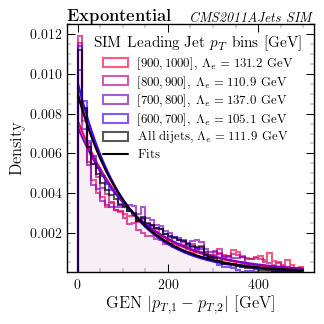

In [23]:
num_pt_bins = 5
num_gev_bins = 50
pt_bins = np.array((600, 700, 800, 900, 1000)) # np.linspace(500, 1000, num_pt_bins + 1)
num_pt_bins = len(pt_bins) - 1

# Initialize array of num_pt_bins arrays
pT_s = [[] for i in range(num_pt_bins + 2)]
diffs = []


leading_jet_px = Z[leading_jet_index, 0] * np.cos(Z[leading_jet_index, 2])
leading_jet_py = Z[leading_jet_index, 0] * np.sin(Z[leading_jet_index, 2])
subleading_jet_px = Z[subleading_jet_index, 0] * np.cos(Z[subleading_jet_index, 2])
subleading_jet_py = Z[subleading_jet_index, 0] * np.sin(Z[subleading_jet_index, 2])

bins = np.digitize(momentum_scale * leading_sim_pt, pt_bins) - 1


for leading, subleading, bin in zip(leading_gen_pt, subleading_gen_pt, bins):

    difference = momentum_scale * (leading - subleading)
    # randomly flip the sign of the difference
    if np.random.rand() > 0.5:
        difference = difference


    print(bin, leading, subleading, difference)
    pT_s[bin].append(np.abs(difference))
    diffs.append(np.abs(difference))



# fit 1/2a exp(-|x|/a) to each of the distributions
from scipy.optimize import curve_fit, minimize
def func(x, a):

    # return 2 / np.sqrt(2 * np.pi * a**2) * np.exp(-np.abs(x**2) / (2 * a**2))

    return 1 / a * np.exp(-np.abs(x**1) / (1 * a**1))


# def kl_divergence_fit(p, q):
#     return np.sum(np.where(p != 0, p * np.log(p / q), 0))

for i in range(num_pt_bins):

    weights = leading_weights[bins == i]
    pT_s[i] = np.array(pT_s[i])
    print(pT_s[i].shape, weights.shape)
    hist, bin_edges = np.histogram(pT_s[i], bins=num_gev_bins, density=True, weights=weights)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # def kl_divergence_fit(a, x = bin_centers, hist = hist):
    #     p = hist
    #     q = func(x, a)
    #     return np.sum(np.where(p != 0, p * np.log(p / q), 0))


    # res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
    # popt = res.x

    popt, pcov = curve_fit(func, bin_centers, hist, p0 = 80)
    
    print(popt, pcov)
    # plt.plot(bin_centers, func(bin_centers, *popt), label=f'Leading $p_T \in [{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3) 

    # function_with_band(ax, func, )



print(pairs.shape)


# # Fit a gaussian to each distribution by minimizing the KL divergence
# from scipy.stats import norm
# from scipy.special import kl_div
# def func(x, mu, sigma):
#     return norm.pdf(x, mu, sigma)

# for i in range(num_pt_bins):
#     pT_s[i] = np.array(pT_s[i])
#     hist, bin_edges = np.histogram(pT_s[i], bins=50, density=True)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#     def kl_divergence_fit(a, x = bin_centers, hist = hist):
#         p = hist
#         q = func(x, a)
#         return np.sum(np.where(p != 0, p * np.log(p / q), 0))


#     res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist)) 
#     popt = [res.x]
#     print(popt)
#     plt.plot(bin_centers, func(bin_centers, *popt), label=f'Leading $p_T \in [{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3)


fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})


gaussian_inclusive_Lambda = 101.7
gaussian_binned_Lambdas_e = []
mean_squared_errors_e = []

for i in range(num_pt_bins)[::-1]:

    weights = leading_weights[bins == i]
    hist, bin_edges = np.histogram(pT_s[i], range=(0, pt_bins[i]/1), bins=num_gev_bins, density=True, weights=weights)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    # def kl_divergence_fit(a, x = bin_centers, hist = hist):
    #         p = hist
    #         q = func(x, a)
    #         return np.sum(np.where(p != 0, p * np.log(p / q), 0))


    # res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
    # popt = res.x

    popt, pcov = curve_fit(func, bin_centers, hist, p0 = 10)

    # get the mean squared error
    mse = np.mean((func(bin_centers, *popt) - hist)**2)
    mean_squared_errors_e.append(mse)


    hist_with_outline(ax, pT_s[i] , range = (-0*500, 500), bins=num_gev_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$, $\Lambda_e = {popt[0] : .1f}$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), weights=weights, alpha_1 = 0.01, alpha_2 = 0.65, lw = 1.5, density = True)
    hist, bin_edges = np.histogram(pT_s[i], range=(-0*pt_bins[i] / 2, pt_bins[i]/2), bins=100, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    gaussian_binned_Lambdas_e.append(popt[0])

    function_with_band(ax, func, [0,500], popt, pcov, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), ls = "-", lw = 1.5, alpha_band= 0.0, alpha_line = 0.99)
    # plt.plot(bin_centers, func(bin_centers, *popt), color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3, alpha = 0.99, ls = "--") 




hist, bin_edges = np.histogram(diffs, range=(-0* 1000/ 2, 1000/2), bins=num_gev_bins, density=True, weights=leading_weights)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
# def kl_divergence_fit(a, x = bin_centers, hist = hist):
#         p = hist
#         q = func(x, a)
#         return np.sum(np.where(p != 0, p * np.log(p / q), 0))


# res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
# popt = res.x

popt, pcov = curve_fit(func, bin_centers, hist, p0 = 10)

mean_squared_errors_e.append(np.mean((func(bin_centers, *popt) - hist)**2))


hist_with_outline(ax, diffs, range = (-0*500, 500), bins=num_gev_bins, label=rf'All dijets, $\Lambda_e = {popt[0] : .1f}$ GeV', color = 'black', weights=leading_weights, alpha_1 = 0.01, alpha_2 = 0.65, lw = 1.5, density = True)
function_with_band(ax, func, [0,500], popt, pcov, color = "black", ls = "-", lw = 1.5, alpha_band= 0.0, alpha_line = 0.99)


# Dummy curve for legend
plt.plot([0, 0], [0, 0], color = "black", ls = "-", lw = 1.5, alpha = 0.99, label = "Fits")


gaussian_inclusive_Lambda_e = popt[0]
gaussian_binned_Lambdas_e = np.array(gaussian_binned_Lambdas_e)[::-1]


plt.ylim(1e-5, 1.25e-2)
legend = plt.legend(frameon=False, loc = 'upper right', title = "SIM Leading Jet $p_T$ bins [GeV]", bbox_to_anchor = (1, 1), fontsize = 9, title_fontsize = 11)
for t in legend.get_texts():
   t.set_ha('right')

# plt.yscale('log')
plt.xlabel("GEN $|p_{T,1} - p_{T,2}|$ [GeV]")
plt.ylabel("Density")

plt.text(0, 1, r"\bf{Expontential}", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)

plt.savefig("Plots/leading_subleading_difference_exponential.pdf")



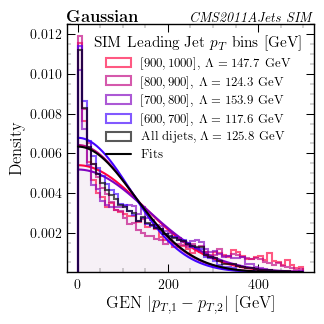

In [24]:


# fit 1/2a exp(-|x|/a) to each of the distributions
from scipy.optimize import curve_fit, minimize
def func(x, a):

    return 2 / np.sqrt(2 * np.pi * a**2) * np.exp(-np.abs(x**2) / (2 * a**2))



fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})


gaussian_inclusive_Lambda = 101.7
gaussian_binned_Lambdas = []
mean_squared_errors = []

for i in range(num_pt_bins)[::-1]:

    weights = leading_weights[bins == i]
    hist, bin_edges = np.histogram(pT_s[i], range=(0, pt_bins[i]/1), bins=num_gev_bins, density=True, weights=weights)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    

    popt, pcov = curve_fit(func, bin_centers, hist, p0 = 10)

    # get the mean squared error
    mse = np.mean((func(bin_centers, *popt) - hist)**2)
    mean_squared_errors.append(mse)

    hist_with_outline(ax, pT_s[i] , range = (-0*500, 500), bins=num_gev_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$, $\Lambda = {popt[0] : .1f}$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), weights=weights, alpha_1 = 0.01, alpha_2 = 0.65, lw = 1.5, density = True)
    hist, bin_edges = np.histogram(pT_s[i], range=(-0*pt_bins[i] / 2, pt_bins[i]/2), bins=100, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    gaussian_binned_Lambdas.append(popt[0])

    function_with_band(ax, func, [0,500], popt, pcov, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), ls = "-", lw = 1.5, alpha_band= 0.0, alpha_line = 0.99)




hist, bin_edges = np.histogram(diffs, range=(-0* 1000/ 2, 1000/2), bins=num_gev_bins, density=True, weights=leading_weights)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
# def kl_divergence_fit(a, x = bin_centers, hist = hist):
#         p = hist
#         q = func(x, a)
#         return np.sum(np.where(p != 0, p * np.log(p / q), 0))


# res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
# popt = res.x

popt, pcov = curve_fit(func, bin_centers, hist, p0 = 10)

mean_squared_errors.append(np.mean((func(bin_centers, *popt) - hist)**2))

hist_with_outline(ax, diffs, range = (-0*500, 500), bins=num_gev_bins, label=rf'All dijets, $\Lambda = {popt[0] : .1f}$ GeV', color = 'black', weights=leading_weights, alpha_1 = 0.01, alpha_2 = 0.65, lw = 1.5, density = True)
function_with_band(ax, func, [0,500], popt, pcov, color = "black", ls = "-", lw = 1.5, alpha_band= 0.0, alpha_line = 0.99)


# Dummy curve for legend
plt.plot([0, 0], [0, 0], color = "black", ls = "-", lw = 1.5, alpha = 0.99, label = "Fits")


gaussian_inclusive_Lambda = popt[0]
gaussian_binned_Lambdas = np.array(gaussian_binned_Lambdas)[::-1]


plt.ylim(1e-5, 1.25e-2)
legend = plt.legend(frameon=False, loc = 'upper right', title = "SIM Leading Jet $p_T$ bins [GeV]", bbox_to_anchor = (1, 1), fontsize = 9, title_fontsize = 11)
for t in legend.get_texts():
   t.set_ha('right')

# plt.yscale('log')
   
plt.text(0, 1, r"\bf{Gaussian}", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)

plt.xlabel("GEN $|p_{T,1} - p_{T,2}|$ [GeV]")
plt.ylabel("Density")

plt.savefig("Plots/leading_subleading_difference.pdf")



In [25]:
# Print the bin, the mean squared error, the lambda, and lambda/(p_T bin center) for exponential and Gaussian as a nice LateX table
print("\\begin{table}[tpbh]")
print("\centering")
print("\\begin{tabular}{|c|c|c|c|c|c|c|}")
print("\hline")
print("\hline")

print("Bin [GeV] & MSE (Exponential) & $\Lambda_e [GeV] $ & $\Lambda_e / p_T$ & MSE (Gaussian) & $\Lambda$ [GeV]& $\Lambda / p_T$ \\\\")
print("\hline")
for i in range(num_pt_bins):

    bin_center = (pt_bins[i] + pt_bins[i+1]) / 2
    bin_lower = pt_bins[i]
    bin_upper = pt_bins[i+1]

    print(f"[{bin_lower},{bin_upper}] & {mean_squared_errors_e[i] : .2e} & {gaussian_binned_Lambdas_e[i] : .1f} & {gaussian_binned_Lambdas_e[i] / bin_center : .3f} & {mean_squared_errors[i] : .2e} & {gaussian_binned_Lambdas[i] : .1f} & {gaussian_binned_Lambdas[i] / bin_center : .3f} \\\\")

print("\hline")

# Now the inclusive
print(f"Inclusive & {np.mean(mean_squared_errors_e) : .2e} & {gaussian_inclusive_Lambda_e : .1f} & {gaussian_inclusive_Lambda_e / 800 : .3f} & {np.mean(mean_squared_errors) : .2e} & {gaussian_inclusive_Lambda : .1f} & {gaussian_inclusive_Lambda / 800 : .3f} \\\\")
print("\hline")
print("\hline")
print("\end{tabular}")
print("\caption{Mean squared errors and fitted $\Lambda$ values for the exponential and Gaussian fits to the $|p_{T,1} - p_{T,2}|$ distributions for different leading jet $p_T$ bins.}")
print("\label{tab:fits}")
print("\end{table}")

    



\begin{table}[tpbh]
\centering
\begin{tabular}{|c|c|c|c|c|c|c|}
\hline
\hline
Bin [GeV] & MSE (Exponential) & $\Lambda_e [GeV] $ & $\Lambda_e / p_T$ & MSE (Gaussian) & $\Lambda$ [GeV]& $\Lambda / p_T$ \\
\hline
[600,700] &  2.80e-07 &  105.1 &  0.162 &  6.74e-07 &  117.6 &  0.181 \\
[700,800] &  2.83e-07 &  137.0 &  0.183 &  8.69e-07 &  153.9 &  0.205 \\
[800,900] &  2.91e-07 &  110.9 &  0.130 &  5.62e-07 &  124.3 &  0.146 \\
[900,1000] &  2.15e-07 &  131.2 &  0.138 &  7.23e-07 &  147.7 &  0.155 \\
\hline
Inclusive &  2.74e-07 &  111.9 &  0.140 &  7.48e-07 &  125.8 &  0.157 \\
\hline
\hline
\end{tabular}
\caption{Mean squared errors and fitted $\Lambda$ values for the exponential and Gaussian fits to the $|p_{T,1} - p_{T,2}|$ distributions for different leading jet $p_T$ bins.}
\label{tab:fits}
\end{table}


# CMS Gaussian/Exponential Scale factors

In [26]:
MODE = "GAUSSIAN"

mode_string = "Gaussian" if MODE == "GAUSSIAN" else "Exponential"
temp_inclusive_lambda = gaussian_inclusive_Lambda if MODE == "GAUSSIAN" else gaussian_inclusive_Lambda_e
temp_binned_lambda = gaussian_binned_Lambdas if MODE == "GAUSSIAN" else gaussian_binned_Lambdas_e


# CMS Result
resolutions_old = [[] for i in range(num_pt_bins)]
resolutions_new = [[] for i in range(num_pt_bins)]


# Get the Scale Factors
leading_Cs = C[leading_jet_index]
subleading_Cs = C[subleading_jet_index]

# Get the pTs
leading_sim_pts = X[leading_jet_index]
subleading_sim_pts = X[subleading_jet_index]

# Get the GEN predictions
leading_predicts = leading_sim_pts[:,0] * leading_Cs
subleading_predicts = subleading_sim_pts[:,0] * subleading_Cs


bins = np.digitize(leading_sim_pt * momentum_scale, pt_bins) - 1


# Get the JERs
res1 = 1.00*leading_predicts * np.sqrt( 30/(momentum_scale * leading_predicts)**2 + 0.81/(momentum_scale * leading_predicts) + 0.04**2   ) 
res2 = 1.00*subleading_predicts * np.sqrt( 30/(momentum_scale * subleading_predicts)**2 + 0.81/(momentum_scale * subleading_predicts) + 0.04**2   ) 



# Calculate
Lambda = temp_binned_lambda[bins] / momentum_scale
detector_jet1 = np.copy(leading_predicts)
detector_jet2 = np.copy(subleading_predicts)
p1hathat, p2hathat, var1hathat, var2hathat = correlation_improved_estimates(detector_jet1, detector_jet2, res1, res2, Lambda, MODE)


resolutions_old = [[] for i in range(num_pt_bins)]
resolutions_new = [[] for i in range(num_pt_bins)]

for (i, bin) in enumerate(bins[:150000]):
    resolutions_old[bin].append(np.abs(res1[i]))
    resolutions_new[bin].append(np.abs(var1hathat[i]))

for (i, bin) in enumerate(bins[:150000]):
    resolutions_old[bin].append(np.abs(res2[i]))
    resolutions_new[bin].append(np.abs(var2hathat[i]))


# Recalculate for inclusive
Lambda = temp_inclusive_lambda/ momentum_scale
detector_jet1 = np.copy(leading_predicts)
detector_jet2 = np.copy(subleading_predicts)

p1hathat, p2hathat, var1hathat, var2hathat = correlation_improved_estimates(detector_jet1, detector_jet2, res1, res2, Lambda, MODE)


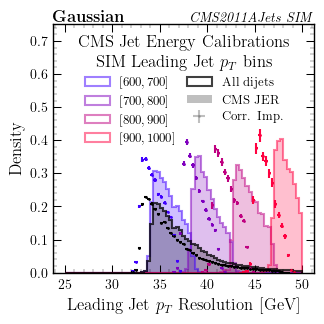

In [27]:
fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})
hist_bins = 75
lower_lim = 25
upper_lim = 50

# hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5)
# plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True)


for i in range(num_pt_bins):
    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]

    # Concatentate weights to itself

    resolutions_old[i] = np.array(resolutions_old[i])
    resolutions_new[i] = np.array(resolutions_new[i])

    size = resolutions_old[i].shape[0]
    

    # print(resolutions_old[i].shape, resolutions_new[i].shape)
    hist_with_errors(ax, momentum_scale * resolutions_new[i][:size //2], range = (lower_lim, upper_lim), bins=hist_bins, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.99, weights=weights, ms = 1)
    hist_with_outline(ax, momentum_scale * resolutions_old[i][:size //2], range = (lower_lim, upper_lim), bins=hist_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), weights=weights, alpha_2 = 0.5, lw = 1.5, density = True)
    



hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.99, ms = 1)
# plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True, label = "All dijets")
hist_with_outline(ax, momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", label = "All dijets", lw = 1.5, density = True)


plt.hist([35], weights = [0], color = "grey", label = "CMS JER", alpha = 0.5, lw = 1.5)
plt.errorbar([35], [-1], xerr = [0], yerr = [0], color = "grey", alpha = 0.5, ls = "none", fmt = 'o', label = "Corr. Imp.", ms = 1)


plt.xlabel("Leading Jet $p_T$ Resolution [GeV]")
plt.ylabel("Density")
legend = plt.legend(loc = "upper center", frameon=False, title = "SIM Leading Jet $p_T$ bins", ncol = 2, bbox_to_anchor = (0.5, 0.92), fontsize = 9, columnspacing=0.75)
for t in legend.get_texts():
   t.set_ha('right')


plt.text(0.5, 0.955, f"CMS Jet Energy Calibrations", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='top', horizontalalignment='center')
plt.text(0, 1, r"\bf{%s}" % mode_string, weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)


plt.ylim(0, 0.75)
plt.savefig(f"Plots/leading_resolution_{mode_string}.pdf")


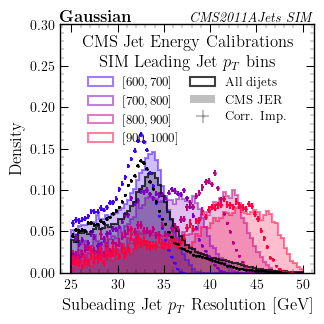

In [28]:
fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})
hist_bins = 75
lower_lim = 25
upper_lim = 50

# hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5)
# plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True)


for i in range(num_pt_bins):
    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]

    # Concatentate weights to itself

    resolutions_old[i] = np.array(resolutions_old[i])
    resolutions_new[i] = np.array(resolutions_new[i])

    size = resolutions_old[i].shape[0]
    

    # print(resolutions_old[i].shape, resolutions_new[i].shape)
    hist_with_errors(ax, momentum_scale * resolutions_new[i][size //2:], range = (lower_lim, upper_lim), bins=hist_bins, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.99, weights=weights, ms = 1)
    # plt.hist(momentum_scale * resolutions_old[i][size //2:], range = (lower_lim, upper_lim), bins=hist_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.5, density=True, weights=weights)
    hist_with_outline(ax, momentum_scale * resolutions_old[i][size //2:], range = (lower_lim, upper_lim), bins=hist_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), weights=weights, alpha_2 = 0.5, lw = 1.5, density = True)


hist_with_errors(ax, momentum_scale * np.array(var2hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.99, ms = 1)
# plt.hist(momentum_scale * np.array(res2), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True, label = "All dijets")
hist_with_outline(ax, momentum_scale * np.array(res2), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", label = "All dijets", lw = 1.5, density = True)



plt.hist([35], weights = [0], color = "grey", label = "CMS JER", alpha = 0.5, lw = 1.5)
plt.errorbar([35], [-1], xerr = [0], yerr = [0], color = "grey", alpha = 0.5, ls = "none", fmt = 'o', label = "Corr. Imp.", ms = 1)


plt.xlabel("Subeading Jet $p_T$ Resolution [GeV]")
plt.ylabel("Density")
legend = plt.legend(loc = "upper center", frameon=False, title = "SIM Leading Jet $p_T$ bins", ncol = 2, bbox_to_anchor = (0.5, 0.92), fontsize = 9, columnspacing=0.75)
for t in legend.get_texts():
   t.set_ha('right')


plt.text(0.5, 0.955, f"CMS Jet Energy Calibrations", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='top', horizontalalignment='center')
plt.text(0, 1, r"\bf{%s}" % mode_string, weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)


plt.ylim(0, 0.75)

plt.ylim(0, 0.3)
plt.savefig(f"Plots/subleading_resolution_{mode_string}.pdf")


0.9591153487011758 0.9692188900792634 0.002562382266420699 0.006513246124272291
0.9691822362760907 0.9778917337462546 0.0017418213659857204 0.005196082856579407
0.9461836579767409 0.9618765674768623 0.00270656516527377 0.010030863826279672
0.9532554128928026 0.9682343750645475 0.002157632770869968 0.008602508785299855


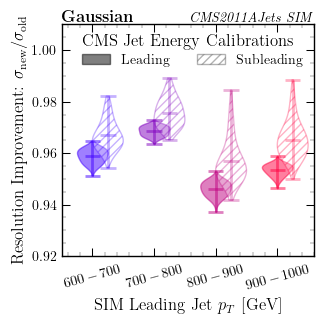

In [29]:
pt_bin_centers = (pt_bins[:-1] + pt_bins[1:]) / 2
pt_bin_widths = (pt_bins[1:] - pt_bins[:-1])[0]
leading_means = []
subleading_means = []
leading_stds = []
subleading_stds = []

fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})


colors = []

for i in range(num_pt_bins):

    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]
    size = resolutions_old[i].shape[0]
    leading_resolution_ratios = resolutions_new[i][:size //2] / resolutions_old[i][:size //2]
    subleading_resolution_ratios = resolutions_new[i][size //2:] / resolutions_old[i][size //2:]

    leading_means.append(np.average(leading_resolution_ratios, weights=weights))
    subleading_means.append(np.average(subleading_resolution_ratios, weights=weights))
    leading_stds.append(np.sqrt(np.average((leading_resolution_ratios - leading_means[-1])**2, weights=weights)))
    subleading_stds.append(np.sqrt(np.average((subleading_resolution_ratios - subleading_means[-1])**2, weights=weights)))



    print(leading_means[-1], subleading_means[-1], leading_stds[-1], subleading_stds[-1])

    # Leading violin plot
    color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins)
    # plt.boxplot(leading_resolution_ratios, positions = [pt_bin_centers[i]], widths = pt_bin_widths/2, whis = (0, 100), patch_artist=True, boxprops=dict(facecolor=color, alpha = 0.5, edgecolor = color, lw = 3), medianprops=dict(color=color, lw = 2), whiskerprops=dict(color=color, lw = 2), capprops=dict(color=color, lw = 2))
    v1 = plt.violinplot(leading_resolution_ratios, positions = [pt_bin_centers[i]], widths = pt_bin_widths/2, showmeans=True, showextrema=True, points=100, bw_method=0.5)
    for pc in v1['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor(color)
        pc.set_alpha(0.5)
    for line in ['cmaxes', 'cmins', 'cbars',  'cmeans']:
        v1[line].set_color(color)
        v1[line].set_linewidth(2)
        v1[line].set_alpha(0.5)


    # Subleading
    subleading_line_alpha = 0.3
    # plt.boxplot(subleading_resolution_ratios, positions = [pt_bin_centers[i] + 25], widths = pt_bin_widths/2, whis = (0, 100), patch_artist=True, boxprops=dict(facecolor = color, alpha = 0.25, edgecolor = color, lw = 3, hatch = "/"), medianprops=dict(color=color, lw = 2, alpha = subleading_line_alpha), whiskerprops=dict(color=color, lw = 2, alpha = subleading_line_alpha), capprops=dict(color=color, lw = 2, alpha = subleading_line_alpha))
    v2 = plt.violinplot(subleading_resolution_ratios, positions = [pt_bin_centers[i] + 25], widths = pt_bin_widths/2, showmeans=True, showextrema=True, points=100, bw_method=0.5)
    for pc in v2['bodies']:
        pc.set_facecolor("white")
        pc.set_edgecolor(color)
        pc.set_alpha(subleading_line_alpha)
        pc.set_hatch("////")
    for line in ['cmaxes', 'cmins', 'cbars', 'cmeans']:
        v2[line].set_color(color)
        v2[line].set_linewidth(2)
        v2[line].set_alpha(subleading_line_alpha)
        

    colors.append(((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins))


# # Inclusive
# leading_resolution_ratios = np.array(var1hathat) / np.array(res1)
# subleading_resolution_ratios = np.array(var2hathat) / np.array(res2)

# plt.boxplot(leading_resolution_ratios, positions = [800], widths = 200, showfliers=False, patch_artist=True, boxprops=dict(facecolor="black", alpha = 0.5, edgecolor = "black", lw = 3), medianprops=dict(color="black", lw = 2), whiskerprops=dict(color="black", lw = 2), capprops=dict(color="black", lw = 2))
# plt.boxplot(subleading_resolution_ratios, positions = [800 + 25], widths = 200, showfliers=False, patch_artist=True, boxprops=dict(facecolor="black", alpha = 0.25, edgecolor = "black", lw = 3, hatch = "/"), medianprops=dict(color="black", lw = 2, alpha = subleading_line_alpha), whiskerprops=dict(color="black", lw = 2, alpha = subleading_line_alpha), capprops=dict(color="black", lw = 2, alpha = subleading_line_alpha))


# # Add dummy violinplots for legend
v1 = plt.violinplot([0], positions = [0], widths = 200, showmedians=False, showextrema=True, points=100, bw_method=0.5)
for pc in v1['bodies']:
    pc.set_facecolor("black")
    pc.set_edgecolor("black")
    pc.set_alpha(0.5)
for line in ['cmaxes', 'cmins', 'cbars']:
    v1[line].set_color("black")
    v1[line].set_linewidth(2)
    v1[line].set_alpha(0.5)

v2 = plt.violinplot([0], positions = [0 + 25], widths = 200, showmedians=False, showextrema=True, points=100, bw_method=0.5)
for pc in v2['bodies']:
    pc.set_facecolor("white")
    pc.set_edgecolor("black")
    pc.set_alpha(subleading_line_alpha)
    pc.set_hatch("////")
for line in ['cmaxes', 'cmins', 'cbars']:
    v2[line].set_color("black")
    v2[line].set_linewidth(2)
    v2[line].set_alpha(subleading_line_alpha)



# plt.errorbar(pt_bin_centers, leading_means, yerr = leading_stds, xerr= pt_bin_widths, fmt = 'o', label = "Leading Jet", colors = colors)
# plt.errorbar(pt_bin_centers, subleading_means, yerr = subleading_stds, xerr= pt_bin_widths/2, fmt = 'o', label = "Subleading Jet", color = "red")
plt.legend([v1["bodies"][0], v2["bodies"][0]], ['Leading', 'Subleading'],loc = "upper right", frameon=False, bbox_to_anchor = (1, 0.925), ncol = 2)



plt.text(0.5, 0.955, f"CMS Jet Energy Calibrations", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='top', horizontalalignment='center')
plt.text(0, 1, r"\bf{%s}" % mode_string, weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)


plt.xlabel("SIM Leading Jet $p_T$ [GeV]")
plt.ylabel("Resolution Improvement: $\sigma_{\mathrm{new}} / \sigma_{\mathrm{old}}$")

plt.ylim(0.92, 1.01)
if MODE == "EXPONENTIAL":
    plt.ylim(0.65, 1.1)

plt.xlim(600, 1010)
plt.xticks(pt_bin_centers, [f'${int(pt_bins[i]) : d}-{int(pt_bins[i+1]) : d}$' for i in range(num_pt_bins)], rotation = 15)


plt.savefig(f"Plots/improvement_{mode_string}.pdf")



Original 747.9863382256946 663.4237859130074 38.58441333920853 25.8450820830326
Prime 726.0883661437009 664.7293107237296 37.44421098629892 34.4075874076875
Original 747.9863382256946 713.2472368670482 35.280772429661866 24.303263599734457
Prime 720.9447060086814 720.7634011022866 37.431445493644944 36.26775721410675
Original 722.8601950907253 617.0476717570664 35.23375859937242 24.45925861654172
Prime 695.8467529291235 622.5169414214527 36.519968352844266 32.686340152739504
Original 736.948276941761 643.369310353875 36.85335621894798 24.191284202061965
Prime 712.5733917834117 648.4778517469149 37.03799784513782 33.672091398413535
Original 726.7350244227619 667.9298674313438 34.479289090832346 23.670855868249873
Prime 710.5010546354947 668.3570429130875 36.68725336083258 34.572212630604234
Original 709.9008531948616 649.6747579073734 34.479289090832346 26.73519042764846
Prime 683.9223798163498 651.144319982117 36.04973975107935 33.89646428541736
(8965,) (8965,) (8965,) (8965,) (8965,)


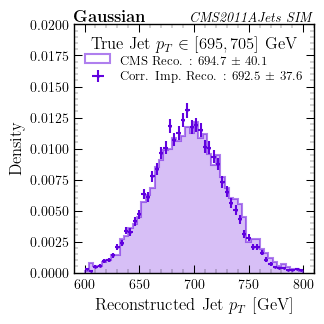

In [30]:

pT_window_lower = 695
pT_window_upper = 705

# Get the list of indices that are in the pT window
true_z_leading = leading_gen_pt * momentum_scale
true_z_subleading = subleading_gen_pt * momentum_scale

leading_indices = np.where((true_z_leading > pT_window_lower) & (true_z_leading < pT_window_upper))[0]
subleading_indices = np.where((true_z_subleading > pT_window_lower) & (true_z_subleading < pT_window_upper))[0]


z1 = momentum_scale * leading_predicts
z2 = momentum_scale * subleading_predicts
sigma_1 =  momentum_scale * res1
sigma_2 =  momentum_scale * res2



Lambda = temp_inclusive_lambda  
z1_primes, z2_primes, sigma1_primes, sigma2_primes = correlation_improved_estimates(z1, z2, sigma_1, sigma_2, Lambda, MODE)




# Apply the pT window 
z1_primes = z1_primes[leading_indices]
z2_primes = z2_primes[subleading_indices]
z1 = z1[leading_indices]
z2 = z2[subleading_indices]
sigma1_primes = sigma1_primes[leading_indices]
sigma2_primes = sigma2_primes[subleading_indices]
weights1 = leading_weights[leading_indices]
weights2 = subleading_weights[subleading_indices]

for i in [1, 2, 3, 4, 5, 6, ]:
    print("Original", z1[i], z2[i], sigma_1[i], sigma_2[i])
    print("Prime", z1_primes[i], z2_primes[i], sigma1_primes[i], sigma2_primes[i])

# Concatenate leading and subleading
z1_primes = np.concatenate((z1_primes, z2_primes))
z1 = np.concatenate((z1, z2))
sigma1_primes = np.concatenate((sigma1_primes, sigma2_primes))
sigma1 = np.concatenate((sigma_1[leading_indices], sigma_2[subleading_indices]))
weights = np.ones_like(z1_primes)


print(weights.shape, z1_primes.shape, z1.shape, sigma1_primes.shape, sigma1.shape)

# Plot
fig, ax = newplot("column", stamp="\it{CMS2011AJets SIM}", stamp_kwargs={"style": "italic", "weight" : None})

plot_bins = 50
hist_range = (600, 800)

color_split = ((0.5+1) / num_pt_bins, 0, 1 - 0.5 / num_pt_bins)

mean = np.average(z1, weights=weights)
std = np.sqrt(np.average((z1 - mean)**2, weights=weights))
mean_prime = np.average(z1_primes, weights=weights)
std_prime = np.sqrt(np.average((z1_primes - mean_prime)**2, weights=weights))


hist_with_outline(ax, z1, range = hist_range, bins=plot_bins, label="CMS Reco. : %.1f $\pm$ %.1f" % (mean, std), color = color_split, alpha_2 = 0.5, lw = 1.5, density=True, weights=weights)
hist_with_errors(ax, z1_primes, range = hist_range, bins=plot_bins, label="Corr. Imp. Reco. : %.1f $\pm$ %.1f" % (mean_prime, std_prime), color = color_split, alpha = 0.99, lw = 1.5,  weights=weights, ms = 1)



plt.text(0.5, 0.955, rf"True Jet $p_T \in [695, 705]$ GeV", weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='top', horizontalalignment='center')
plt.text(0, 1, r"\bf{%s}" % mode_string, weight = "bold", color = "black", transform = plt.gca().transAxes, verticalalignment='bottom', horizontalalignment='left', fontsize = 12)

# plt.axvline(700, color = "black", alpha = 0.5, lw = 1.5, ls = "--")


print(np.std(z1), np.std(z1_primes))

plt.ylim(0, 0.02)

plt.legend(loc = "upper right", frameon=False, bbox_to_anchor = (1, 0.925), fontsize = 9)
plt.xlabel("Reconstructed Jet $p_T$ [GeV]")
plt.ylabel("Density")

plt.savefig(f"Plots/reco_{mode_string}.pdf", bbox_inches = "tight")

# # plt.hist( (z1_primes - leading_gen_pt * momentum_scale)**2 , bins = 100, weights=leading_weights, density=True, alpha = 0.5, range = (0, 100))
# # plt.hist( (z1 - leading_gen_pt * momentum_scale)**2 , bins = 100, weights=leading_weights, density=True, alpha = 0.5, range = (0, 100))

# # prime_avg = np.average((z1_primes - leading_gen_pt * momentum_scale)**2, weights=leading_weights / np.sum(leading_weights))
# # old_avg = np.average((z1 - leading_gen_pt * momentum_scale)**2, weights=leading_weights / np.sum(leading_weights))

# # print(prime_avg, old_avg)
# # print(1 - prime_avg / old_avg)

# # print(np.average((z1_primes - leading_gen_pt * momentum_scale)**2, weights=leading_weights))
# # print(np.average((z1 - leading_gen_pt * momentum_scale)**2, weights=leading_weights))

# newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})

# leading_prime_avgs = []
# leading_old_avgs = []
# subleading_prime_avgs = []
# subleading_old_avgs = []

# for i in range(num_pt_bins):

#     z1_primes = z1_primes[:150000]
#     z2_primes = z2_primes[:150000]
#     z1 = z1[:150000]
#     z2 = z2[:150000]

#     temp = leading_weights[:150000]
#     weights = temp[bins[:150000] == i]

#     leading_gen_pt = leading_gen_pt[:150000]
#     subleading_gen_pt = subleading_gen_pt[:150000]


#     leading_prime_avg = np.average((z1_primes[bins[:150000] == i] - leading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))
#     leading_old_avg = np.average((z1[bins[:150000] == i] - leading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))

#     subleading_prime_avg = np.average((z2_primes[bins[:150000] == i] - subleading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))
#     subleading_old_avg = np.average((z2[bins[:150000] == i] - subleading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))

#     leading_prime_avgs.append(leading_prime_avg)
#     leading_old_avgs.append(leading_old_avg)
#     subleading_prime_avgs.append(subleading_prime_avg)
#     subleading_old_avgs.append(subleading_old_avg)

#     print(np.sqrt(leading_prime_avg / leading_old_avg))
#     print(np.sqrt(subleading_prime_avg / subleading_old_avg))


# plt.errorbar(pt_bin_centers, np.sqrt(leading_prime_avgs), yerr = 0, xerr= pt_bin_widths/2, fmt = '^', label = "Leading Jet (Corr. Imp.)", color = "blue", lw = 3)
# plt.errorbar(pt_bin_centers, np.sqrt(subleading_prime_avgs), yerr = 0, xerr= pt_bin_widths/2, fmt = '^', label = "Subleading Jet  (Corr. Imp.)", color = "red", lw = 3)

# plt.errorbar(pt_bin_centers, np.sqrt(leading_old_avgs), yerr = 0, xerr= pt_bin_widths/2, fmt = 'o', label = "Leading Jet", color = "darkblue", alpha = 0.95, lw = 3)
# plt.errorbar(pt_bin_centers, np.sqrt(subleading_old_avgs), yerr = 0, xerr= pt_bin_widths/2, fmt = 'o', label = "Subleading Jet", color = "darkred", alpha = 0.95, lw = 3)

# plt.legend(loc = "upper left", frameon=False)

# plt.xlabel("Leading Jet $p_T$ [GeV]")
# plt.ylabel("Mean Squared Error [GeV$^2$]")

# plt.savefig("Plots/MSE.pdf")


